In [1]:
import os
import shutil
import json

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"
os.environ["TORCH_USE_CUDA_DSA"] = "1"

In [2]:
import logging

loggers = [logging.getLogger(name) for name in logging.root.manager.loggerDict]
for logger in loggers:
    if "transformers" in logger.name.lower():
        logger.setLevel(logging.ERROR)

In [3]:
from models.data import ArabicSocialMediaDataModule
from farasa.ner import FarasaNamedEntityRecognizer
from farasa.pos import FarasaPOSTagger

In [4]:
# Initialize text transforms
farasa_pos_tagger = FarasaPOSTagger(interactive=True)
farasa_ner_recognizer = FarasaNamedEntityRecognizer(interactive=True)

[2025-09-24 16:35:47,581 - farasapy_logger - WARNING]: Be careful with large lines as they may break on interactive mode. You may switch to Standalone mode for such cases.


[2025-09-24 16:35:52,426 - farasapy_logger - WARNING]: Be careful with large lines as they may break on interactive mode. You may switch to Standalone mode for such cases.


In [5]:
# Initialize the data module
data_module = ArabicSocialMediaDataModule(
    text_transforms={
        "pos": farasa_pos_tagger.tag,
        "ner": farasa_ner_recognizer.recognize,
    },
)

data_module.setup()

In [6]:
# Define the model (you can switch between different models)

from models.models import LitXLMRobertaModelWithTextTransforms
import pytorch_lightning as pl
from pytorch_lightning.callbacks import (
    ModelCheckpoint,
    EarlyStopping,
)

In [7]:
import numpy as np
import pandas as pd
from tabulate import tabulate
import matplotlib.pyplot as plt

class CrossModelExperimentWithTextTransforms:
    def __init__(self, max_epochs=100, results_file=None, num_runs=10):
        self.max_epochs = max_epochs
        self.num_runs = num_runs
        self.results_file = results_file
        if self.results_file is None:
            self.results_file = "notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json"
        
        self.checkpoints_path = "trained_detectors/Arabic/ArabicSocialMediaDataset/{train_model}AIDetectorWithTextTransforms/checkpoints"
        self.test_models = ["allam", "jais-batched", "llama-batched", "openai"]
        self.train_models = ["allam", "jais-batched", "llama-batched", "openai"]
        
        # Text transforms - POS and NER only
        self.text_transforms = {
            "pos": farasa_pos_tagger.tag,
            "ner": farasa_ner_recognizer.recognize,
        }
        
        # Load existing results if available
        self.all_results = self._load_results()

    def _load_results(self):
        """Load existing results from JSON file."""
        if os.path.exists(self.results_file):
            try:
                with open(self.results_file, 'r') as f:
                    results = json.load(f)
                print(f"Results loaded from {self.results_file}")
                return results
            except Exception as e:
                print(f"Warning: Could not load results from {self.results_file}: {e}")
                return {}
        else:
            print(f"No existing results file found at {self.results_file}")
            return {}
    
    def _save_results(self):
        """Save results to JSON file."""
        with open(self.results_file, 'w') as f:
            json.dump(self.all_results, f, indent=4, ensure_ascii=False, default=str)
        print(f"Results saved to {self.results_file}")

    def _get_callbacks(self, train_model):
        early_stopping = EarlyStopping(
            monitor="val_loss",
            min_delta=0.0,
            patience=5,
            verbose=True,
            mode="min",
        )

        checkpoint = ModelCheckpoint(
            monitor="val_loss",
            dirpath=self.checkpoints_path.format(train_model=train_model.title()),
            filename="best-checkpoint",
            save_top_k=1,
            mode="min",
        )

        return [early_stopping, checkpoint]

    def _test_on_model(self, trainer, model, test_model, train_model):
        # Load the best checkpoint before testing
        checkpoint_path = self.checkpoints_path.format(train_model=train_model.title())
        checkpoint_path += "/best-checkpoint.ckpt"
        model = LitXLMRobertaModelWithTextTransforms.load_from_checkpoint(checkpoint_path)
        model.eval()
        test_datamodule = ArabicSocialMediaDataModule(
            batch_size=16,
            models=[test_model],
            text_transforms=self.text_transforms
        )
        test_datamodule.setup()

        results = trainer.test(model, test_datamodule.test_dataloader())[0]
        return {
            "accuracy": results["test_acc"],
            "precision": results["test_precision"],
            "recall": results["test_recall"],
            "f1": results["test_f1"],
            "loss": results["test_loss"],
        }

    def run_single_experiment(self, train_model, run_number):
        """Run a single experiment for a specific train model and run number."""
        print(f"\n{'='*60}")
        print(f"Train Model: {train_model}, Run: {run_number + 1}/{self.num_runs}")
        print(f"Using Text Transforms: POS and NER")
        print(f"{'='*60}")
        
        # Initialize components
        model = LitXLMRobertaModelWithTextTransforms()
        train_datamodule = ArabicSocialMediaDataModule(
            batch_size=16,
            models=[train_model],
            text_transforms=self.text_transforms
        )
        trainer = pl.Trainer(
            devices=1,
            max_epochs=self.max_epochs,
            accelerator="auto",
            val_check_interval=0.25,
            check_val_every_n_epoch=1,
            callbacks=self._get_callbacks(train_model),
        )

        # Train the model
        print(f"Training on {train_model} data with text transforms...")
        model.train()
        trainer.fit(model, train_datamodule)

        # Test on all specified models
        results = {}
        for test_model in self.test_models:
            model.eval()
            print(f"Testing on {test_model} data...")
            results[test_model] = self._test_on_model(
                trainer, model, test_model, train_model
            )

        # Display results for this run
        self._display_single_run_results(train_model, run_number, results)

        # Clean up checkpoints to save space
        checkpoint_dir = self.checkpoints_path.format(train_model=train_model.title())
        print(f"Cleaning up checkpoint directory: {checkpoint_dir}")
        shutil.rmtree(checkpoint_dir, ignore_errors=True)

        return results

    def _display_single_run_results(self, train_model, run_number, results):
        """Display results for a single run."""
        print(f"\nResults for {train_model} with text transforms, run {run_number + 1}:")
        print("-" * 80)
        print(f"{'Test Model':<15} {'Accuracy':<10} {'Precision':<10} {'Recall':<10} {'F1':<10} {'Loss':<10}")
        print("-" * 80)
        for test_model, metrics in results.items():
            print(
                f"{test_model:<15}"
                f"{metrics['accuracy']:<10.4f}"
                f"{metrics['precision']:<10.4f}"
                f"{metrics['recall']:<10.4f}"
                f"{metrics['f1']:<10.4f}"
                f"{metrics['loss']:<10.4f}"
            )
        print("-" * 80)

    def run_all_experiments(self):
        """Run the complete experiment with multiple runs for each train model."""
        for train_model in self.train_models:
            if train_model not in self.all_results:
                self.all_results[train_model] = []
            
            # Continue from where we left off
            completed_runs = len(self.all_results[train_model])
            
            if completed_runs >= self.num_runs:
                print(f"\nAll runs completed for training model: {train_model} ({completed_runs}/{self.num_runs})")
                continue
            
            print(f"\nStarting remaining runs for training model: {train_model} ({completed_runs}/{self.num_runs} completed)")
            
            for run_number in range(completed_runs, self.num_runs):
                print(f"\nStarting experiment for {train_model}, run {run_number + 1}/{self.num_runs}")
                try:
                    results = self.run_single_experiment(train_model, run_number)
                    self.all_results[train_model].append(results)
                    
                    # Save results after each run
                    self._save_results()
                    
                except Exception as e:
                    print(f"Error in run {run_number + 1} for {train_model}: {str(e)}")
                    # Save what we have so far
                    self._save_results()
                    raise

        print(f"\nAll experiments completed!")
        print(f"Final results saved to: {self.results_file}")

    def calculate_statistics(self):
        """Calculate mean and std for all metrics across runs."""
        stats = {}
        metrics = ['accuracy', 'precision', 'recall', 'f1']
        
        for train_model, runs in self.all_results.items():
            if not runs:
                continue
                
            stats[train_model] = {}
            
            for test_model in self.test_models:
                # Collect metrics across all runs
                metrics_data = {
                    'accuracy': [run[test_model]['accuracy'] for run in runs if test_model in run],
                    'precision': [run[test_model]['precision'] for run in runs if test_model in run],
                    'recall': [run[test_model]['recall'] for run in runs if test_model in run],
                    'f1': [run[test_model]['f1'] for run in runs if test_model in run],
                    'loss': [run[test_model]['loss'] for run in runs if test_model in run],
                }
                
                # Calculate mean and std
                stats[train_model][test_model] = {}
                for metric, values in metrics_data.items():
                    if values:
                        stats[train_model][test_model][f'{metric}_mean'] = np.mean(values) * 100  # Convert to percentage
                        stats[train_model][test_model][f'{metric}_std'] = np.std(values, ddof=1) * 100  # Sample std
                        
        return stats

    def print_summary_table(self):
        """Print a summary table with mean ± std for each metric."""
        stats = self.calculate_statistics()
        
        print("\nCross-Model Detection with Text Transforms Results Summary (Mean ± Std)")
        print("Text Transforms: POS and NER")
        print("=" * 120)
        
        # Prepare table data
        headers = ['Metric', 'Train → Test', 'ALLaM', 'Jais', 'Llama', 'OpenAI']
        table_data = []
        
        model_display_names = {
            'allam': 'ALLaM',
            'jais-batched': 'Jais',
            'llama-batched': 'Llama', 
            'openai': 'OpenAI'
        }
        
        metrics = ['accuracy', 'precision', 'recall', 'f1']
        
        for metric in metrics:
            for i, train_model in enumerate(self.train_models):
                if train_model in stats:
                    if i == 0:  # First row for this metric
                        row = [metric.capitalize(), model_display_names[train_model]]
                    else:
                        row = ['', model_display_names[train_model]]
                    
                    for test_model in self.test_models:
                        if test_model in stats[train_model]:
                            mean_val = stats[train_model][test_model].get(f'{metric}_mean', 0)
                            std_val = stats[train_model][test_model].get(f'{metric}_std', 0)
                            formatted_value = f"{mean_val:.2f} ± {std_val:.2f}"
                        else:
                            formatted_value = "N/A"
                        
                        row.append(formatted_value)
                    
                    table_data.append(row)
        
        print(tabulate(table_data, headers=headers, tablefmt='grid', stralign='center'))

In [8]:
# Initialize the experiment
experiment = CrossModelExperimentWithTextTransforms(
    max_epochs=100,
    results_file="notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json",
    num_runs=10
)

print("Starting Cross-Model Detection Experiments with Text Transforms")
print("Text Transforms: POS and NER")
print(f"Train models: {experiment.train_models}")
print(f"Test models: {experiment.test_models}")
print(f"Number of runs per train model: {experiment.num_runs}")
print(f"Results will be saved to: {experiment.results_file}")

Results loaded from notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json
Starting Cross-Model Detection Experiments with Text Transforms
Text Transforms: POS and NER
Train models: ['allam', 'jais-batched', 'llama-batched', 'openai']
Test models: ['allam', 'jais-batched', 'llama-batched', 'openai']
Number of runs per train model: 10
Results will be saved to: notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json


In [9]:
# Run the experiments
experiment.run_all_experiments()


Starting remaining runs for training model: allam (0/10 completed)

Starting experiment for allam, run 1/10

Train Model: allam, Run: 1/10
Using Text Transforms: POS and NER


/home/majed_alshaibani/Projects/arabic-text-detection/.venv/lib/python3.10/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python3 /home/majed_alshaibani/Projects/arabic-text-detecti ...
GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


/home/majed_alshaibani/Projects/arabic-text-detection/.venv/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/logger_connector/logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
You are using a CUDA device ('NVIDIA RTX A5000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


Training on allam data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

/home/majed_alshaibani/Projects/arabic-text-detection/.venv/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:433: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


/home/majed_alshaibani/Projects/arabic-text-detection/.venv/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.661


Validation: |                                                                                                 …

Metric val_loss improved by 0.318 >= min_delta = 0.0. New best score: 0.343


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.038 >= min_delta = 0.0. New best score: 0.305


Validation: |                                                                                                 …

Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 0.292


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 0.275


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.272


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.270


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.270. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/majed_alshaibani/Projects/arabic-text-detection/.venv/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:433: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9277108311653137
         test_f1            0.9081388711929321
        test_loss           0.21441958844661713
     test_precision         0.9669529795646667
       test_recall          0.8696216940879822
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9598393440246582
         test_f1            0.9524611234664917
        test_loss           0.13891851902008057
     test_precision         0.9688408374786377
       test_recall          0.9417839050292969
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7530120611190796
         test_f1            0.6369078159332275
        test_loss            0.619631826877594
     test_precision         0.9429336786270142
       test_recall          0.5085658431053162
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9759036302566528
         test_f1             0.97162926197052
        test_loss           0.12321097403764725
     test_precision         0.9694846272468567
       test_recall          0.9765022993087769
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for allam with text transforms, run 1:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9277    0.9670    0.8696    0.9081    0.2144    
jais-batched   0.9598    0.9688    0.9418    0.9525    0.1389    
llama-batched  0.7530    0.9429    0.5086    0.6369    0.6196    
openai         0.9759    0.9695    0.9765    0.9716    0.1232    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/AllamAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for allam, run 2/10

Train Model: allam, Run: 2/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on allam data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.508


Validation: |                                                                                                 …

Metric val_loss improved by 0.105 >= min_delta = 0.0. New best score: 0.402


Validation: |                                                                                                 …

Metric val_loss improved by 0.040 >= min_delta = 0.0. New best score: 0.362


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.031 >= min_delta = 0.0. New best score: 0.331


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 0.312


Validation: |                                                                                                 …

Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 0.295


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.285


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.021 >= min_delta = 0.0. New best score: 0.264


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.264. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9176706671714783
         test_f1             0.904377818107605
        test_loss           0.23075468838214874
     test_precision         0.9248619079589844
       test_recall          0.8958414793014526
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9518072009086609
         test_f1            0.9446056485176086
        test_loss           0.15463583171367645
     test_precision         0.9299058318138123
       test_recall          0.9657539129257202
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7751004099845886
         test_f1             0.696950376033783
        test_loss           0.5572972893714905
     test_precision         0.8911455869674683
       test_recall          0.5964735746383667
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9568272829055786
         test_f1            0.9525272250175476
        test_loss           0.15005505084991455
     test_precision         0.9315435290336609
       test_recall          0.9801805019378662
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for allam with text transforms, run 2:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9177    0.9249    0.8958    0.9044    0.2308    
jais-batched   0.9518    0.9299    0.9658    0.9446    0.1546    
llama-batched  0.7751    0.8911    0.5965    0.6970    0.5573    
openai         0.9568    0.9315    0.9802    0.9525    0.1501    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/AllamAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for allam, run 3/10

Train Model: allam, Run: 3/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on allam data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.690


Validation: |                                                                                                 …

Metric val_loss improved by 0.146 >= min_delta = 0.0. New best score: 0.544


Validation: |                                                                                                 …

Metric val_loss improved by 0.110 >= min_delta = 0.0. New best score: 0.434


Validation: |                                                                                                 …

Metric val_loss improved by 0.098 >= min_delta = 0.0. New best score: 0.337


Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.336


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.038 >= min_delta = 0.0. New best score: 0.298


Validation: |                                                                                                 …

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.287


Validation: |                                                                                                 …

Metric val_loss improved by 0.015 >= min_delta = 0.0. New best score: 0.271


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 0.258


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.258. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9236947894096375
         test_f1            0.9083815813064575
        test_loss           0.21791721880435944
     test_precision         0.9488557577133179
       test_recall           0.88209068775177
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9588353633880615
         test_f1            0.9523677229881287
        test_loss           0.13935646414756775
     test_precision         0.9531213641166687
       test_recall          0.9571793079376221
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7570281028747559
         test_f1            0.6539076566696167
        test_loss           0.5831992030143738
     test_precision         0.9132530093193054
       test_recall          0.5345694422721863
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9708835482597351
         test_f1            0.9660201668739319
        test_loss           0.11470429599285126
     test_precision         0.9531010389328003
       test_recall          0.9821885228157043
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for allam with text transforms, run 3:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9237    0.9489    0.8821    0.9084    0.2179    
jais-batched   0.9588    0.9531    0.9572    0.9524    0.1394    
llama-batched  0.7570    0.9133    0.5346    0.6539    0.5832    
openai         0.9709    0.9531    0.9822    0.9660    0.1147    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/AllamAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for allam, run 4/10

Train Model: allam, Run: 4/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on allam data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.567


Validation: |                                                                                                 …

Metric val_loss improved by 0.081 >= min_delta = 0.0. New best score: 0.486


Validation: |                                                                                                 …

Metric val_loss improved by 0.068 >= min_delta = 0.0. New best score: 0.417


Validation: |                                                                                                 …

Metric val_loss improved by 0.056 >= min_delta = 0.0. New best score: 0.362


Validation: |                                                                                                 …

Metric val_loss improved by 0.038 >= min_delta = 0.0. New best score: 0.324


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.313


Validation: |                                                                                                 …

Metric val_loss improved by 0.026 >= min_delta = 0.0. New best score: 0.287


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.282


Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.278


Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.275


Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.265


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.263


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.263


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.263. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9246987700462341
         test_f1            0.9083239436149597
        test_loss           0.22313565015792847
     test_precision          0.949211597442627
       test_recall          0.8843408823013306
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9558233022689819
         test_f1            0.9470415711402893
        test_loss           0.1544530689716339
     test_precision         0.9516094923019409
       test_recall          0.9501990079879761
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7610442042350769
         test_f1            0.6628546714782715
        test_loss           0.6065620183944702
     test_precision         0.9098106622695923
       test_recall          0.5465283989906311
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9658634662628174
         test_f1            0.9613907933235168
        test_loss           0.14426682889461517
     test_precision         0.9522908926010132
       test_recall          0.9753612279891968
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for allam with text transforms, run 4:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9247    0.9492    0.8843    0.9083    0.2231    
jais-batched   0.9558    0.9516    0.9502    0.9470    0.1545    
llama-batched  0.7610    0.9098    0.5465    0.6629    0.6066    
openai         0.9659    0.9523    0.9754    0.9614    0.1443    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/AllamAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for allam, run 5/10

Train Model: allam, Run: 5/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on allam data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.692


Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.682


Validation: |                                                                                                 …

Metric val_loss improved by 0.268 >= min_delta = 0.0. New best score: 0.413


Validation: |                                                                                                 …

Metric val_loss improved by 0.058 >= min_delta = 0.0. New best score: 0.355


Validation: |                                                                                                 …

Metric val_loss improved by 0.032 >= min_delta = 0.0. New best score: 0.323


Validation: |                                                                                                 …

Metric val_loss improved by 0.038 >= min_delta = 0.0. New best score: 0.284


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.274


Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.268


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.261


Validation: |                                                                                                 …

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.261


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.261. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9246987700462341
         test_f1            0.9073280096054077
        test_loss           0.21517619490623474
     test_precision         0.9642060399055481
       test_recall          0.8692647218704224
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9628514051437378
         test_f1            0.9550108313560486
        test_loss           0.14038461446762085
     test_precision         0.9662526845932007
       test_recall          0.9503397941589355
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7530120611190796
         test_f1             0.646712064743042
        test_loss           0.6384640336036682
     test_precision         0.9318034648895264
       test_recall          0.5206511616706848
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9708835482597351
         test_f1             0.966507613658905
        test_loss           0.13167566061019897
     test_precision         0.9663297533988953
       test_recall          0.9704782366752625
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for allam with text transforms, run 5:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9247    0.9642    0.8693    0.9073    0.2152    
jais-batched   0.9629    0.9663    0.9503    0.9550    0.1404    
llama-batched  0.7530    0.9318    0.5207    0.6467    0.6385    
openai         0.9709    0.9663    0.9705    0.9665    0.1317    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/AllamAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for allam, run 6/10

Train Model: allam, Run: 6/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on allam data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.543


Validation: |                                                                                                 …

Metric val_loss improved by 0.184 >= min_delta = 0.0. New best score: 0.359


Validation: |                                                                                                 …

Metric val_loss improved by 0.046 >= min_delta = 0.0. New best score: 0.313


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 0.301


Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.299


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.289


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.285


Validation: |                                                                                                 …

Metric val_loss improved by 0.025 >= min_delta = 0.0. New best score: 0.259


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.259. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9206827282905579
         test_f1             0.903533935546875
        test_loss           0.23210835456848145
     test_precision          0.941760778427124
       test_recall          0.8796752691268921
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9568272829055786
         test_f1            0.9495351314544678
        test_loss           0.15952488780021667
     test_precision          0.947205126285553
       test_recall          0.9580596685409546
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7751004099845886
         test_f1            0.6860096454620361
        test_loss           0.5744779109954834
     test_precision         0.9070568680763245
       test_recall          0.5769364237785339
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9698795080184937
         test_f1             0.965317964553833
        test_loss           0.13970829546451569
     test_precision         0.9481300115585327
       test_recall          0.9870524406433105
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for allam with text transforms, run 6:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9207    0.9418    0.8797    0.9035    0.2321    
jais-batched   0.9568    0.9472    0.9581    0.9495    0.1595    
llama-batched  0.7751    0.9071    0.5769    0.6860    0.5745    
openai         0.9699    0.9481    0.9871    0.9653    0.1397    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/AllamAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for allam, run 7/10

Train Model: allam, Run: 7/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on allam data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.678


Validation: |                                                                                                 …

Metric val_loss improved by 0.123 >= min_delta = 0.0. New best score: 0.554


Validation: |                                                                                                 …

Metric val_loss improved by 0.114 >= min_delta = 0.0. New best score: 0.440


Validation: |                                                                                                 …

Metric val_loss improved by 0.070 >= min_delta = 0.0. New best score: 0.370


Validation: |                                                                                                 …

Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 0.357


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.031 >= min_delta = 0.0. New best score: 0.326


Validation: |                                                                                                 …

Metric val_loss improved by 0.035 >= min_delta = 0.0. New best score: 0.292


Validation: |                                                                                                 …

Metric val_loss improved by 0.015 >= min_delta = 0.0. New best score: 0.277


Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.270


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.265


Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.265


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.258


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.258. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9126505851745605
         test_f1            0.9002771973609924
        test_loss           0.22497285902500153
     test_precision         0.9225172996520996
       test_recall          0.8917929530143738
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9467871189117432
         test_f1            0.9419422745704651
        test_loss           0.15138418972492218
     test_precision         0.9268127083778381
       test_recall          0.9637458920478821
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.763052225112915
         test_f1            0.6790032982826233
        test_loss           0.5948631167411804
     test_precision         0.8949130177497864
       test_recall          0.5829470753669739
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9548192620277405
         test_f1            0.9522165060043335
        test_loss           0.13269715011119843
     test_precision         0.9278048276901245
       test_recall          0.9826347827911377
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for allam with text transforms, run 7:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9127    0.9225    0.8918    0.9003    0.2250    
jais-batched   0.9468    0.9268    0.9637    0.9419    0.1514    
llama-batched  0.7631    0.8949    0.5829    0.6790    0.5949    
openai         0.9548    0.9278    0.9826    0.9522    0.1327    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/AllamAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for allam, run 8/10

Train Model: allam, Run: 8/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on allam data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.611


Validation: |                                                                                                 …

Metric val_loss improved by 0.113 >= min_delta = 0.0. New best score: 0.498


Validation: |                                                                                                 …

Metric val_loss improved by 0.065 >= min_delta = 0.0. New best score: 0.432


Validation: |                                                                                                 …

Metric val_loss improved by 0.075 >= min_delta = 0.0. New best score: 0.357


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.036 >= min_delta = 0.0. New best score: 0.321


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.033 >= min_delta = 0.0. New best score: 0.289


Validation: |                                                                                                 …

Metric val_loss improved by 0.028 >= min_delta = 0.0. New best score: 0.260


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.255


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.255. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.922690749168396
         test_f1            0.9061934351921082
        test_loss           0.2152828425168991
     test_precision         0.9464959502220154
       test_recall          0.8831494450569153
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9618473649024963
         test_f1            0.9545738697052002
        test_loss           0.14180046319961548
     test_precision         0.9494739174842834
       test_recall          0.9664232730865479
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7489959597587585
         test_f1            0.6416901350021362
        test_loss           0.5934869050979614
     test_precision         0.9054121375083923
       test_recall          0.5235772132873535
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9638554453849792
         test_f1            0.9585457444190979
        test_loss           0.14017173647880554
     test_precision          0.949192464351654
       test_recall          0.9733978509902954
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for allam with text transforms, run 8:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9227    0.9465    0.8831    0.9062    0.2153    
jais-batched   0.9618    0.9495    0.9664    0.9546    0.1418    
llama-batched  0.7490    0.9054    0.5236    0.6417    0.5935    
openai         0.9639    0.9492    0.9734    0.9585    0.1402    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/AllamAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for allam, run 9/10

Train Model: allam, Run: 9/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on allam data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.691


Validation: |                                                                                                 …

Metric val_loss improved by 0.145 >= min_delta = 0.0. New best score: 0.546


Validation: |                                                                                                 …

Metric val_loss improved by 0.104 >= min_delta = 0.0. New best score: 0.442


Validation: |                                                                                                 …

Metric val_loss improved by 0.092 >= min_delta = 0.0. New best score: 0.349


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.339


Validation: |                                                                                                 …

Metric val_loss improved by 0.015 >= min_delta = 0.0. New best score: 0.325


Validation: |                                                                                                 …

Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 0.305


Validation: |                                                                                                 …

Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 0.283


Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.278


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.275


Validation: |                                                                                                 …

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.267


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.267. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9246987700462341
         test_f1             0.911185622215271
        test_loss           0.23133717477321625
     test_precision         0.9575574398040771
       test_recall          0.8817846775054932
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9638554453849792
         test_f1            0.9593149423599243
        test_loss           0.1577467918395996
     test_precision         0.9597356915473938
       test_recall            0.9643514752388
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7610442042350769
         test_f1            0.6655846238136292
        test_loss           0.5510705709457397
     test_precision         0.9267024397850037
       test_recall          0.5462647676467896
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9708835482597351
         test_f1            0.9686398506164551
        test_loss           0.14823569357395172
     test_precision         0.9591696858406067
       test_recall          0.9812961220741272
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for allam with text transforms, run 9:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9247    0.9576    0.8818    0.9112    0.2313    
jais-batched   0.9639    0.9597    0.9644    0.9593    0.1577    
llama-batched  0.7610    0.9267    0.5463    0.6656    0.5511    
openai         0.9709    0.9592    0.9813    0.9686    0.1482    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/AllamAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for allam, run 10/10

Train Model: allam, Run: 10/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on allam data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.634


Validation: |                                                                                                 …

Metric val_loss improved by 0.155 >= min_delta = 0.0. New best score: 0.479


Validation: |                                                                                                 …

Metric val_loss improved by 0.073 >= min_delta = 0.0. New best score: 0.406


Validation: |                                                                                                 …

Metric val_loss improved by 0.070 >= min_delta = 0.0. New best score: 0.336


Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.333


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.033 >= min_delta = 0.0. New best score: 0.300


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 0.286


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.282


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.272


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 0.258


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.258. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9156626462936401
         test_f1            0.9024748206138611
        test_loss           0.2344755083322525
     test_precision         0.9305663108825684
       test_recall          0.8902508616447449
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9538152813911438
         test_f1            0.9491469264030457
        test_loss           0.16940072178840637
     test_precision         0.9338102340698242
       test_recall          0.9710965156555176
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7730923891067505
         test_f1            0.6940018534660339
        test_loss           0.5081431865692139
     test_precision          0.896881639957428
       test_recall          0.5906089544296265
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9598393440246582
         test_f1            0.9566618204116821
        test_loss           0.15972097218036652
     test_precision         0.9343631267547607
       test_recall          0.9850444197654724
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for allam with text transforms, run 10:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9157    0.9306    0.8903    0.9025    0.2345    
jais-batched   0.9538    0.9338    0.9711    0.9491    0.1694    
llama-batched  0.7731    0.8969    0.5906    0.6940    0.5081    
openai         0.9598    0.9344    0.9850    0.9567    0.1597    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/AllamAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting remaining runs for training model: jais-batched (0/10 completed)

Starting experiment for jais-batched, run 1/10

Train Model: jais-batched, Run: 1/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on jais-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.654


Validation: |                                                                                                 …

Metric val_loss improved by 0.060 >= min_delta = 0.0. New best score: 0.594


Validation: |                                                                                                 …

Metric val_loss improved by 0.211 >= min_delta = 0.0. New best score: 0.383


Validation: |                                                                                                 …

Metric val_loss improved by 0.164 >= min_delta = 0.0. New best score: 0.219


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.125 >= min_delta = 0.0. New best score: 0.093


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.084


Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.078


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.077


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.077. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8855421543121338
         test_f1            0.8521550893783569
        test_loss           0.44974786043167114
     test_precision         0.9669338464736938
       test_recall          0.7795847058296204
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.968875527381897
         test_f1            0.9629245400428772
        test_loss           0.0858357697725296
     test_precision         0.9694145321846008
       test_recall          0.9597878456115723
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.736947774887085
         test_f1            0.6161561012268066
        test_loss           0.9905880093574524
     test_precision         0.9461655616760254
       test_recall          0.48391780257225037
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9477911591529846
         test_f1            0.9416642189025879
        test_loss           0.17142271995544434
     test_precision         0.9694964289665222
       test_recall          0.9215385317802429
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for jais-batched with text transforms, run 1:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8855    0.9669    0.7796    0.8522    0.4497    
jais-batched   0.9689    0.9694    0.9598    0.9629    0.0858    
llama-batched  0.7369    0.9462    0.4839    0.6162    0.9906    
openai         0.9478    0.9695    0.9215    0.9417    0.1714    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Jais-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for jais-batched, run 2/10

Train Model: jais-batched, Run: 2/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on jais-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.363


Validation: |                                                                                                 …

Metric val_loss improved by 0.170 >= min_delta = 0.0. New best score: 0.193


Validation: |                                                                                                 …

Metric val_loss improved by 0.015 >= min_delta = 0.0. New best score: 0.178


Validation: |                                                                                                 …

Metric val_loss improved by 0.053 >= min_delta = 0.0. New best score: 0.125


Validation: |                                                                                                 …

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.118


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.109


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.100


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.097


Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.095


Validation: |                                                                                                 …

Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 0.082


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.082. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8875501751899719
         test_f1            0.8574104905128479
        test_loss           0.43082302808761597
     test_precision          0.961999773979187
       test_recall          0.7914341688156128
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9698795080184937
         test_f1            0.9636520147323608
        test_loss           0.0961540937423706
     test_precision         0.9665489792823792
       test_recall          0.9651426076889038
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7329317331314087
         test_f1            0.6009526252746582
        test_loss           0.8789239525794983
     test_precision         0.9272708892822266
       test_recall          0.4717247188091278
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9407630562782288
         test_f1            0.9331338405609131
        test_loss           0.17473475635051727
     test_precision         0.9640078544616699
       test_recall          0.9102674722671509
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for jais-batched with text transforms, run 2:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8876    0.9620    0.7914    0.8574    0.4308    
jais-batched   0.9699    0.9665    0.9651    0.9637    0.0962    
llama-batched  0.7329    0.9273    0.4717    0.6010    0.8789    
openai         0.9408    0.9640    0.9103    0.9331    0.1747    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Jais-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for jais-batched, run 3/10

Train Model: jais-batched, Run: 3/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on jais-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.484


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.349 >= min_delta = 0.0. New best score: 0.135


Validation: |                                                                                                 …

Metric val_loss improved by 0.024 >= min_delta = 0.0. New best score: 0.111


Validation: |                                                                                                 …

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.100


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.091


Validation: |                                                                                                 …

Metric val_loss improved by 0.016 >= min_delta = 0.0. New best score: 0.075


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.075. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8975903391838074
         test_f1            0.8716462850570679
        test_loss           0.4008607864379883
     test_precision         0.9578944444656372
       test_recall          0.8141043186187744
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9658634662628174
         test_f1            0.9597101807594299
        test_loss           0.12321044504642487
     test_precision         0.9637012481689453
       test_recall          0.9605017900466919
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7550200819969177
         test_f1            0.6517020463943481
        test_loss           0.8691858053207397
     test_precision         0.9226812124252319
       test_recall          0.5263316631317139
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9497991800308228
         test_f1            0.9434464573860168
        test_loss           0.17697228491306305
     test_precision         0.9626691937446594
       test_recall          0.9308907389640808
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for jais-batched with text transforms, run 3:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8976    0.9579    0.8141    0.8716    0.4009    
jais-batched   0.9659    0.9637    0.9605    0.9597    0.1232    
llama-batched  0.7550    0.9227    0.5263    0.6517    0.8692    
openai         0.9498    0.9627    0.9309    0.9434    0.1770    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Jais-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for jais-batched, run 4/10

Train Model: jais-batched, Run: 4/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on jais-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.360


Validation: |                                                                                                 …

Metric val_loss improved by 0.191 >= min_delta = 0.0. New best score: 0.169


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.021 >= min_delta = 0.0. New best score: 0.147


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.027 >= min_delta = 0.0. New best score: 0.120


Validation: |                                                                                                 …

Metric val_loss improved by 0.033 >= min_delta = 0.0. New best score: 0.087


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.087. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8955823183059692
         test_f1            0.8693464994430542
        test_loss           0.3468576669692993
     test_precision         0.9437559247016907
       test_recall          0.8177187442779541
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9588353633880615
         test_f1            0.9524317979812622
        test_loss           0.1265547275543213
     test_precision         0.9524047374725342
       test_recall          0.9573144912719727
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc                   0.75
         test_f1            0.6447373628616333
        test_loss           0.7388160228729248
     test_precision         0.9244915246963501
       test_recall          0.5243229866027832
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9558233022689819
         test_f1            0.9492149949073792
        test_loss           0.1390310823917389
     test_precision         0.9522656202316284
       test_recall          0.9516147971153259
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for jais-batched with text transforms, run 4:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8956    0.9438    0.8177    0.8693    0.3469    
jais-batched   0.9588    0.9524    0.9573    0.9524    0.1266    
llama-batched  0.7500    0.9245    0.5243    0.6447    0.7388    
openai         0.9558    0.9523    0.9516    0.9492    0.1390    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Jais-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for jais-batched, run 5/10

Train Model: jais-batched, Run: 5/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on jais-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.419


Validation: |                                                                                                 …

Metric val_loss improved by 0.111 >= min_delta = 0.0. New best score: 0.308


Validation: |                                                                                                 …

Metric val_loss improved by 0.118 >= min_delta = 0.0. New best score: 0.190


Validation: |                                                                                                 …

Metric val_loss improved by 0.039 >= min_delta = 0.0. New best score: 0.152


Validation: |                                                                                                 …

Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 0.132


Validation: |                                                                                                 …

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.132


Validation: |                                                                                                 …

Metric val_loss improved by 0.025 >= min_delta = 0.0. New best score: 0.107


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 0.087


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 0.074


Validation: |                                                                                                 …

Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.066


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.065


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.065. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8875501751899719
         test_f1            0.8569011688232422
        test_loss           0.5297786593437195
     test_precision         0.9702735543251038
       test_recall          0.7832357287406921
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9678714871406555
         test_f1            0.9608191847801208
        test_loss           0.09724850207567215
     test_precision         0.9734302163124084
       test_recall          0.9524180889129639
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7158634662628174
         test_f1             0.574760913848877
        test_loss           1.1589144468307495
     test_precision         0.9378849267959595
       test_recall          0.4372543394565582
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9317269325256348
         test_f1            0.9222975969314575
        test_loss           0.21678312122821808
     test_precision         0.9721807837486267
       test_recall          0.8846283555030823
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for jais-batched with text transforms, run 5:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8876    0.9703    0.7832    0.8569    0.5298    
jais-batched   0.9679    0.9734    0.9524    0.9608    0.0972    
llama-batched  0.7159    0.9379    0.4373    0.5748    1.1589    
openai         0.9317    0.9722    0.8846    0.9223    0.2168    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Jais-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for jais-batched, run 6/10

Train Model: jais-batched, Run: 6/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on jais-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.520


Validation: |                                                                                                 …

Metric val_loss improved by 0.250 >= min_delta = 0.0. New best score: 0.270


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.115 >= min_delta = 0.0. New best score: 0.155


Validation: |                                                                                                 …

Metric val_loss improved by 0.027 >= min_delta = 0.0. New best score: 0.128


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.028 >= min_delta = 0.0. New best score: 0.099


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.018 >= min_delta = 0.0. New best score: 0.082


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.080


Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.075


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.071


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.068


Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.067


Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.062


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.057


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.057. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8865461945533752
         test_f1            0.8544865846633911
        test_loss           0.5870788097381592
     test_precision          0.969859778881073
       test_recall           0.781216025352478
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9748995900154114
         test_f1            0.9692825675010681
        test_loss           0.10502754896879196
     test_precision         0.9732261896133423
       test_recall          0.9686868786811829
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7228915691375732
         test_f1             0.583454966545105
        test_loss           1.2983840703964233
     test_precision         0.9110919833183289
       test_recall          0.4534536302089691
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9206827282905579
         test_f1             0.90650874376297
        test_loss           0.3101554214954376
     test_precision         0.9705806970596313
       test_recall          0.8599015474319458
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for jais-batched with text transforms, run 6:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8865    0.9699    0.7812    0.8545    0.5871    
jais-batched   0.9749    0.9732    0.9687    0.9693    0.1050    
llama-batched  0.7229    0.9111    0.4535    0.5835    1.2984    
openai         0.9207    0.9706    0.8599    0.9065    0.3102    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Jais-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for jais-batched, run 7/10

Train Model: jais-batched, Run: 7/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on jais-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.383


Validation: |                                                                                                 …

Metric val_loss improved by 0.049 >= min_delta = 0.0. New best score: 0.334


Validation: |                                                                                                 …

Metric val_loss improved by 0.152 >= min_delta = 0.0. New best score: 0.182


Validation: |                                                                                                 …

Metric val_loss improved by 0.036 >= min_delta = 0.0. New best score: 0.146


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.031 >= min_delta = 0.0. New best score: 0.115


Validation: |                                                                                                 …

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 0.095


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.090


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.018 >= min_delta = 0.0. New best score: 0.072


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.066


Validation: |                                                                                                 …

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.065


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.064


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.057


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.057. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8925702571868896
         test_f1             0.864294171333313
        test_loss           0.4576603174209595
     test_precision         0.9726200103759766
       test_recall          0.7924923300743103
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9789156913757324
         test_f1            0.9730075597763062
        test_loss           0.08360860496759415
     test_precision          0.977120578289032
       test_recall          0.9724026918411255
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.736947774887085
         test_f1            0.6080023050308228
        test_loss            1.134515404701233
     test_precision          0.92820805311203
       test_recall          0.47512757778167725
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9327309131622314
         test_f1            0.9238439202308655
        test_loss           0.2251337319612503
     test_precision         0.9750621914863586
       test_recall          0.8849354982376099
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for jais-batched with text transforms, run 7:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8926    0.9726    0.7925    0.8643    0.4577    
jais-batched   0.9789    0.9771    0.9724    0.9730    0.0836    
llama-batched  0.7369    0.9282    0.4751    0.6080    1.1345    
openai         0.9327    0.9751    0.8849    0.9238    0.2251    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Jais-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for jais-batched, run 8/10

Train Model: jais-batched, Run: 8/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on jais-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.469


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.294 >= min_delta = 0.0. New best score: 0.175


Validation: |                                                                                                 …

Metric val_loss improved by 0.024 >= min_delta = 0.0. New best score: 0.150


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 0.130


Validation: |                                                                                                 …

Metric val_loss improved by 0.025 >= min_delta = 0.0. New best score: 0.105


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 0.088


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.083


Validation: |                                                                                                 …

Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 0.071


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.070


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.070. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8825300931930542
         test_f1            0.8532286286354065
        test_loss           0.40822845697402954
     test_precision          0.957798957824707
       test_recall          0.7843332290649414
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9678714871406555
         test_f1            0.9607328176498413
        test_loss           0.10354402661323547
     test_precision         0.9650596976280212
       test_recall          0.9615727663040161
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7098393440246582
         test_f1            0.5647667646408081
        test_loss           0.9438645243644714
     test_precision         0.9168100953102112
       test_recall          0.43035754561424255
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9257028102874756
         test_f1            0.9188920855522156
        test_loss           0.22168011963367462
     test_precision         0.9617135524749756
       test_recall          0.8869608640670776
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for jais-batched with text transforms, run 8:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8825    0.9578    0.7843    0.8532    0.4082    
jais-batched   0.9679    0.9651    0.9616    0.9607    0.1035    
llama-batched  0.7098    0.9168    0.4304    0.5648    0.9439    
openai         0.9257    0.9617    0.8870    0.9189    0.2217    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Jais-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for jais-batched, run 9/10

Train Model: jais-batched, Run: 9/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on jais-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.703


Validation: |                                                                                                 …

Metric val_loss improved by 0.520 >= min_delta = 0.0. New best score: 0.183


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.032 >= min_delta = 0.0. New best score: 0.150


Validation: |                                                                                                 …

Metric val_loss improved by 0.037 >= min_delta = 0.0. New best score: 0.114


Validation: |                                                                                                 …

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.103


Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.101


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.089


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.085


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.074


Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.064


Validation: |                                                                                                 …

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.064


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.064. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8724899888038635
         test_f1            0.8365318179130554
        test_loss           0.5072784423828125
     test_precision         0.9568299055099487
       test_recall          0.7622380256652832
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9668674468994141
         test_f1            0.9608745574951172
        test_loss           0.08393719047307968
     test_precision         0.9625856280326843
       test_recall          0.9629426598548889
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7399598360061646
         test_f1            0.6250227689743042
        test_loss           0.9415440559387207
     test_precision         0.9043794274330139
       test_recall          0.49435892701148987
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8835341334342957
         test_f1            0.8623294234275818
        test_loss           0.33477941155433655
     test_precision          0.958486795425415
       test_recall          0.7971284985542297
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for jais-batched with text transforms, run 9:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8725    0.9568    0.7622    0.8365    0.5073    
jais-batched   0.9669    0.9626    0.9629    0.9609    0.0839    
llama-batched  0.7400    0.9044    0.4944    0.6250    0.9415    
openai         0.8835    0.9585    0.7971    0.8623    0.3348    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Jais-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for jais-batched, run 10/10

Train Model: jais-batched, Run: 10/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on jais-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.503


Validation: |                                                                                                 …

Metric val_loss improved by 0.233 >= min_delta = 0.0. New best score: 0.269


Validation: |                                                                                                 …

Metric val_loss improved by 0.054 >= min_delta = 0.0. New best score: 0.216


Validation: |                                                                                                 …

Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 0.193


Validation: |                                                                                                 …

Metric val_loss improved by 0.080 >= min_delta = 0.0. New best score: 0.113


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.108


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.108


Validation: |                                                                                                 …

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.100


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.018 >= min_delta = 0.0. New best score: 0.082


Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.077


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.074


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.069


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.065


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.065. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8925702571868896
         test_f1            0.8627749681472778
        test_loss           0.4257000982761383
     test_precision         0.9707255959510803
       test_recall          0.7938125133514404
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9728915691375732
         test_f1            0.9681878685951233
        test_loss           0.09308920055627823
     test_precision         0.9738321900367737
       test_recall          0.9658565521240234
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.727911651134491
         test_f1            0.6005822420120239
        test_loss           1.0808045864105225
     test_precision         0.9397144317626953
       test_recall          0.46584609150886536
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9427710771560669
         test_f1             0.935327410697937
        test_loss           0.18616707623004913
     test_precision         0.9728177189826965
       test_recall           0.907597005367279
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for jais-batched with text transforms, run 10:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8926    0.9707    0.7938    0.8628    0.4257    
jais-batched   0.9729    0.9738    0.9659    0.9682    0.0931    
llama-batched  0.7279    0.9397    0.4658    0.6006    1.0808    
openai         0.9428    0.9728    0.9076    0.9353    0.1862    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Jais-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting remaining runs for training model: llama-batched (0/10 completed)

Starting experiment for llama-batched, run 1/10

Train Model: llama-batched, Run: 1/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on llama-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.694


Validation: |                                                                                                 …

Metric val_loss improved by 0.015 >= min_delta = 0.0. New best score: 0.679


Validation: |                                                                                                 …

Metric val_loss improved by 0.083 >= min_delta = 0.0. New best score: 0.596


Validation: |                                                                                                 …

Metric val_loss improved by 0.455 >= min_delta = 0.0. New best score: 0.141


Validation: |                                                                                                 …

Metric val_loss improved by 0.056 >= min_delta = 0.0. New best score: 0.084


Validation: |                                                                                                 …

Metric val_loss improved by 0.031 >= min_delta = 0.0. New best score: 0.053


Validation: |                                                                                                 …

Metric val_loss improved by 0.016 >= min_delta = 0.0. New best score: 0.038


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.033


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.029


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.028


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.019


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.019


Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.017


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.017. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6526104211807251
         test_f1            0.41703787446022034
        test_loss           1.8278976678848267
     test_precision         0.8749666213989258
       test_recall          0.28961390256881714
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6375501751899719
         test_f1            0.38210931420326233
        test_loss           1.8803983926773071
     test_precision         0.8472365140914917
       test_recall          0.25883275270462036
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9889557957649231
         test_f1            0.9840250015258789
        test_loss          0.035854633897542953
     test_precision         0.9806012511253357
       test_recall          0.9892012476921082
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6024096608161926
         test_f1            0.2816098928451538
        test_loss           2.0970020294189453
     test_precision         0.7483265995979309
       test_recall          0.1824556589126587
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for llama-batched with text transforms, run 1:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.6526    0.8750    0.2896    0.4170    1.8279    
jais-batched   0.6376    0.8472    0.2588    0.3821    1.8804    
llama-batched  0.9890    0.9806    0.9892    0.9840    0.0359    
openai         0.6024    0.7483    0.1825    0.2816    2.0970    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Llama-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for llama-batched, run 2/10

Train Model: llama-batched, Run: 2/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on llama-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.607


Validation: |                                                                                                 …

Metric val_loss improved by 0.235 >= min_delta = 0.0. New best score: 0.372


Validation: |                                                                                                 …

Metric val_loss improved by 0.189 >= min_delta = 0.0. New best score: 0.182


Validation: |                                                                                                 …

Metric val_loss improved by 0.069 >= min_delta = 0.0. New best score: 0.113


Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.103


Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.098


Validation: |                                                                                                 …

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 0.079


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.023 >= min_delta = 0.0. New best score: 0.056


Validation: |                                                                                                 …

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.049


Validation: |                                                                                                 …

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.042


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.040


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.035


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.031


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.028


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.028. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.650602400302887
         test_f1            0.41331368684768677
        test_loss           1.8779033422470093
     test_precision         0.8755020499229431
       test_recall          0.2855978310108185
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6395582556724548
         test_f1            0.3908281922340393
        test_loss           1.9461644887924194
     test_precision         0.8607764840126038
       test_recall          0.26472294330596924
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9859437942504883
         test_f1             0.980238139629364
        test_loss           0.03944770246744156
     test_precision         0.9805649518966675
       test_recall          0.9823739528656006
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6054216623306274
         test_f1            0.2895289957523346
        test_loss            2.13354754447937
     test_precision         0.7432396411895752
       test_recall          0.18892598152160645
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for llama-batched with text transforms, run 2:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.6506    0.8755    0.2856    0.4133    1.8779    
jais-batched   0.6396    0.8608    0.2647    0.3908    1.9462    
llama-batched  0.9859    0.9806    0.9824    0.9802    0.0394    
openai         0.6054    0.7432    0.1889    0.2895    2.1335    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Llama-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for llama-batched, run 3/10

Train Model: llama-batched, Run: 3/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training on llama-batched data with text transforms...



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.638


Validation: |                                                                                                 …

Metric val_loss improved by 0.157 >= min_delta = 0.0. New best score: 0.481


Validation: |                                                                                                 …

Metric val_loss improved by 0.264 >= min_delta = 0.0. New best score: 0.217


Validation: |                                                                                                 …

Metric val_loss improved by 0.069 >= min_delta = 0.0. New best score: 0.147


Validation: |                                                                                                 …

Metric val_loss improved by 0.060 >= min_delta = 0.0. New best score: 0.088


Validation: |                                                                                                 …

Metric val_loss improved by 0.039 >= min_delta = 0.0. New best score: 0.049


Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.043


Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.037


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.034


Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.030


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.029


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.029


Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.028


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.022


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.021


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.021. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6526104211807251
         test_f1            0.41610634326934814
        test_loss            1.854366421699524
     test_precision         0.8741633296012878
       test_recall          0.28906625509262085
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6405622363090515
         test_f1            0.39222076535224915
        test_loss           1.8922346830368042
     test_precision         0.8615796566009521
       test_recall          0.26793578267097473
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.986947774887085
         test_f1            0.9810394644737244
        test_loss           0.05359147489070892
     test_precision         0.9784280061721802
       test_recall          0.9854083061218262
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6064257025718689
         test_f1            0.29192522168159485
        test_loss           2.0944252014160156
     test_precision          0.763052225112915
       test_recall          0.19093400239944458
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for llama-batched with text transforms, run 3:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.6526    0.8742    0.2891    0.4161    1.8544    
jais-batched   0.6406    0.8616    0.2679    0.3922    1.8922    
llama-batched  0.9869    0.9784    0.9854    0.9810    0.0536    
openai         0.6064    0.7631    0.1909    0.2919    2.0944    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Llama-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for llama-batched, run 4/10

Train Model: llama-batched, Run: 4/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training on llama-batched data with text transforms...



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.692


Validation: |                                                                                                 …

Metric val_loss improved by 0.215 >= min_delta = 0.0. New best score: 0.477


Validation: |                                                                                                 …

Metric val_loss improved by 0.308 >= min_delta = 0.0. New best score: 0.170


Validation: |                                                                                                 …

Metric val_loss improved by 0.083 >= min_delta = 0.0. New best score: 0.087


Validation: |                                                                                                 …

Metric val_loss improved by 0.026 >= min_delta = 0.0. New best score: 0.061


Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.057


Validation: |                                                                                                 …

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.049


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.049. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.654618501663208
         test_f1            0.41962337493896484
        test_loss            1.423356294631958
     test_precision         0.8883534669876099
       test_recall          0.2902832329273224
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6375501751899719
         test_f1            0.3749217092990875
        test_loss            1.455664873123169
     test_precision         0.8548861742019653
       test_recall          0.25249624252319336
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9879518151283264
         test_f1            0.9817681312561035
        test_loss           0.04221799224615097
     test_precision         0.9835463762283325
       test_recall          0.9821954369544983
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6044176816940308
         test_f1            0.28391724824905396
        test_loss           1.6052523851394653
     test_precision         0.7603747844696045
       test_recall          0.18334810435771942
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for llama-batched with text transforms, run 4:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.6546    0.8884    0.2903    0.4196    1.4234    
jais-batched   0.6376    0.8549    0.2525    0.3749    1.4557    
llama-batched  0.9880    0.9835    0.9822    0.9818    0.0422    
openai         0.6044    0.7604    0.1833    0.2839    1.6053    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Llama-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for llama-batched, run 5/10

Train Model: llama-batched, Run: 5/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training on llama-batched data with text transforms...



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.662


Validation: |                                                                                                 …

Metric val_loss improved by 0.221 >= min_delta = 0.0. New best score: 0.441


Validation: |                                                                                                 …

Metric val_loss improved by 0.312 >= min_delta = 0.0. New best score: 0.129


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.058 >= min_delta = 0.0. New best score: 0.071


Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.068


Validation: |                                                                                                 …

Metric val_loss improved by 0.016 >= min_delta = 0.0. New best score: 0.052


Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.047


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.039


Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.034


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.032


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.032. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6536144614219666
         test_f1            0.4156661331653595
        test_loss           1.5453391075134277
     test_precision         0.8875501751899719
       test_recall           0.287605881690979
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6355421543121338
         test_f1            0.37597864866256714
        test_loss           1.5962404012680054
     test_precision         0.8696117401123047
       test_recall          0.25037866830825806
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9879518151283264
         test_f1            0.9812851548194885
        test_loss           0.04216763749718666
     test_precision         0.9821183681488037
       test_recall          0.9821954369544983
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6064257025718689
         test_f1            0.2882187068462372
        test_loss           1.7311596870422363
     test_precision         0.7576974034309387
       test_recall          0.1869179606437683
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for llama-batched with text transforms, run 5:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.6536    0.8876    0.2876    0.4157    1.5453    
jais-batched   0.6355    0.8696    0.2504    0.3760    1.5962    
llama-batched  0.9880    0.9821    0.9822    0.9813    0.0422    
openai         0.6064    0.7577    0.1869    0.2882    1.7312    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Llama-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for llama-batched, run 6/10

Train Model: llama-batched, Run: 6/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training on llama-batched data with text transforms...



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.585


Validation: |                                                                                                 …

Metric val_loss improved by 0.061 >= min_delta = 0.0. New best score: 0.524


Validation: |                                                                                                 …

Metric val_loss improved by 0.278 >= min_delta = 0.0. New best score: 0.246


Validation: |                                                                                                 …

Metric val_loss improved by 0.138 >= min_delta = 0.0. New best score: 0.108


Validation: |                                                                                                 …

Metric val_loss improved by 0.039 >= min_delta = 0.0. New best score: 0.069


Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.063


Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.053


Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.051


Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.044


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.040


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.028


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.026


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.026. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6536144614219666
         test_f1            0.4179612100124359
        test_loss            1.673031210899353
     test_precision          0.878982663154602
       test_recall          0.29107430577278137
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6435742974281311
         test_f1            0.40084895491600037
        test_loss           1.6944048404693604
     test_precision         0.8637215495109558
       test_recall          0.2742467224597931
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9889557957649231
         test_f1            0.9838780164718628
        test_loss           0.02868977002799511
     test_precision         0.9803335070610046
       test_recall          0.9892012476921082
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6064257025718689
         test_f1            0.29126057028770447
        test_loss           1.8737114667892456
     test_precision         0.7684069275856018
       test_recall          0.19026467204093933
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for llama-batched with text transforms, run 6:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.6536    0.8790    0.2911    0.4180    1.6730    
jais-batched   0.6436    0.8637    0.2742    0.4008    1.6944    
llama-batched  0.9890    0.9803    0.9892    0.9839    0.0287    
openai         0.6064    0.7684    0.1903    0.2913    1.8737    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Llama-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for llama-batched, run 7/10

Train Model: llama-batched, Run: 7/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on llama-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.658


Validation: |                                                                                                 …

Metric val_loss improved by 0.173 >= min_delta = 0.0. New best score: 0.485


Validation: |                                                                                                 …

Metric val_loss improved by 0.375 >= min_delta = 0.0. New best score: 0.110


Validation: |                                                                                                 …

Metric val_loss improved by 0.047 >= min_delta = 0.0. New best score: 0.063


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.057


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.052


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.047


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.044


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.036


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.032


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.027


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.024


Validation: |                                                                                                 …

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.023


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.022


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.022. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6516064405441284
         test_f1            0.41417643427848816
        test_loss            2.203087091445923
     test_precision         0.8781794905662537
       test_recall          0.28599944710731506
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6375501751899719
         test_f1            0.3794043958187103
        test_loss           2.2704367637634277
     test_precision         0.8481927514076233
       test_recall          0.25682470202445984
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.986947774887085
         test_f1            0.9820231199264526
        test_loss          0.037522219121456146
     test_precision         0.9820859432220459
       test_recall          0.9838018417358398
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6034136414527893
         test_f1            0.2827129065990448
        test_loss            2.507124185562134
     test_precision         0.7523427605628967
       test_recall          0.1826341599225998
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for llama-batched with text transforms, run 7:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.6516    0.8782    0.2860    0.4142    2.2031    
jais-batched   0.6376    0.8482    0.2568    0.3794    2.2704    
llama-batched  0.9869    0.9821    0.9838    0.9820    0.0375    
openai         0.6034    0.7523    0.1826    0.2827    2.5071    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Llama-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for llama-batched, run 8/10

Train Model: llama-batched, Run: 8/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on llama-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.679


Validation: |                                                                                                 …

Metric val_loss improved by 0.070 >= min_delta = 0.0. New best score: 0.608


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.599


Validation: |                                                                                                 …

Metric val_loss improved by 0.317 >= min_delta = 0.0. New best score: 0.281


Validation: |                                                                                                 …

Metric val_loss improved by 0.202 >= min_delta = 0.0. New best score: 0.080


Validation: |                                                                                                 …

Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 0.066


Validation: |                                                                                                 …

Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 0.044


Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.039


Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.034


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.030


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.026


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.022


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.022. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6556224822998047
         test_f1            0.4238095283508301
        test_loss           1.9569281339645386
     test_precision         0.8835341334342957
       test_recall          0.29470089077949524
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6405622363090515
         test_f1            0.38576969504356384
        test_loss           2.0057871341705322
     test_precision         0.8696117997169495
       test_recall          0.2603052854537964
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9889557957649231
         test_f1            0.9835530519485474
        test_loss          0.034571509808301926
     test_precision         0.9835463762283325
       test_recall          0.9854083061218262
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6064257025718689
         test_f1            0.28862667083740234
        test_loss            2.243339776992798
     test_precision         0.7576974034309387
       test_recall          0.1869179606437683
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for llama-batched with text transforms, run 8:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.6556    0.8835    0.2947    0.4238    1.9569    
jais-batched   0.6406    0.8696    0.2603    0.3858    2.0058    
llama-batched  0.9890    0.9835    0.9854    0.9836    0.0346    
openai         0.6064    0.7577    0.1869    0.2886    2.2433    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Llama-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for llama-batched, run 9/10

Train Model: llama-batched, Run: 9/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on llama-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.608


Validation: |                                                                                                 …

Metric val_loss improved by 0.169 >= min_delta = 0.0. New best score: 0.439


Validation: |                                                                                                 …

Metric val_loss improved by 0.254 >= min_delta = 0.0. New best score: 0.185


Validation: |                                                                                                 …

Metric val_loss improved by 0.098 >= min_delta = 0.0. New best score: 0.087


Validation: |                                                                                                 …

Metric val_loss improved by 0.024 >= min_delta = 0.0. New best score: 0.063


Validation: |                                                                                                 …

Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.053


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.048


Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.043


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.043. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.650602400302887
         test_f1            0.41279467940330505
        test_loss            2.010233163833618
     test_precision          0.874966561794281
       test_recall          0.28599944710731506
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6375501751899719
         test_f1            0.38433873653411865
        test_loss            2.092283010482788
     test_precision         0.8589022755622864
       test_recall          0.2599036991596222
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9859437942504883
         test_f1             0.98092120885849
        test_loss           0.05167856439948082
     test_precision         0.9800089597702026
       test_recall          0.9838018417358398
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6024096608161926
         test_f1            0.28113269805908203
        test_loss           2.2907769680023193
     test_precision         0.7402945160865784
       test_recall          0.1826341599225998
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for llama-batched with text transforms, run 9:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.6506    0.8750    0.2860    0.4128    2.0102    
jais-batched   0.6376    0.8589    0.2599    0.3843    2.0923    
llama-batched  0.9859    0.9800    0.9838    0.9809    0.0517    
openai         0.6024    0.7403    0.1826    0.2811    2.2908    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Llama-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for llama-batched, run 10/10

Train Model: llama-batched, Run: 10/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on llama-batched data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.688


Validation: |                                                                                                 …

Metric val_loss improved by 0.183 >= min_delta = 0.0. New best score: 0.505


Validation: |                                                                                                 …

Metric val_loss improved by 0.277 >= min_delta = 0.0. New best score: 0.229


Validation: |                                                                                                 …

Metric val_loss improved by 0.062 >= min_delta = 0.0. New best score: 0.167


Validation: |                                                                                                 …

Metric val_loss improved by 0.096 >= min_delta = 0.0. New best score: 0.071


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 0.049


Validation: |                                                                                                 …

Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 0.037


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.036


Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.030


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.027


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.027


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.027. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6485943794250488
         test_f1            0.4061199426651001
        test_loss            1.986306071281433
     test_precision         0.8848728537559509
       test_recall          0.2787705361843109
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6275100111961365
         test_f1            0.3512817621231079
        test_loss           2.0965654850006104
     test_precision         0.8219544887542725
       test_recall          0.23360049724578857
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9839357137680054
         test_f1            0.9778387546539307
        test_loss          0.041311848908662796
     test_precision         0.9822643995285034
       test_recall          0.9753681421279907
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.5903614163398743
         test_f1            0.2471325844526291
        test_loss           2.2935962677001953
     test_precision         0.7362784743309021
       test_recall          0.15634429454803467
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for llama-batched with text transforms, run 10:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.6486    0.8849    0.2788    0.4061    1.9863    
jais-batched   0.6275    0.8220    0.2336    0.3513    2.0966    
llama-batched  0.9839    0.9823    0.9754    0.9778    0.0413    
openai         0.5904    0.7363    0.1563    0.2471    2.2936    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/Llama-BatchedAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting remaining runs for training model: openai (0/10 completed)

Starting experiment for openai, run 1/10

Train Model: openai, Run: 1/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training on openai data with text transforms...



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.569


Validation: |                                                                                                 …

Metric val_loss improved by 0.244 >= min_delta = 0.0. New best score: 0.324


Validation: |                                                                                                 …

Metric val_loss improved by 0.081 >= min_delta = 0.0. New best score: 0.243


Validation: |                                                                                                 …

Metric val_loss improved by 0.148 >= min_delta = 0.0. New best score: 0.096


Validation: |                                                                                                 …

Metric val_loss improved by 0.031 >= min_delta = 0.0. New best score: 0.065


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 0.051


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.018 >= min_delta = 0.0. New best score: 0.033


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.033. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9066265225410461
         test_f1            0.8750678896903992
        test_loss           0.4289885461330414
     test_precision         0.9807165861129761
       test_recall          0.8086655735969543
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9578313231468201
         test_f1            0.9488512873649597
        test_loss           0.15474148094654083
     test_precision         0.9807165861129761
       test_recall           0.924298107624054
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7259036302566528
         test_f1            0.5787535309791565
        test_loss           1.1859393119812012
     test_precision          0.936393141746521
       test_recall          0.44185805320739746
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9849397540092468
         test_f1            0.9805562496185303
        test_loss          0.057117484509944916
     test_precision         0.9819149971008301
       test_recall          0.9814675450325012
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for openai with text transforms, run 1:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9066    0.9807    0.8087    0.8751    0.4290    
jais-batched   0.9578    0.9807    0.9243    0.9489    0.1547    
llama-batched  0.7259    0.9364    0.4419    0.5788    1.1859    
openai         0.9849    0.9819    0.9815    0.9806    0.0571    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/OpenaiAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for openai, run 2/10

Train Model: openai, Run: 2/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on openai data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.374


Validation: |                                                                                                 …

Metric val_loss improved by 0.156 >= min_delta = 0.0. New best score: 0.218


Validation: |                                                                                                 …

Metric val_loss improved by 0.083 >= min_delta = 0.0. New best score: 0.135


Validation: |                                                                                                 …

Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 0.123


Validation: |                                                                                                 …

Metric val_loss improved by 0.027 >= min_delta = 0.0. New best score: 0.096


Validation: |                                                                                                 …

Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 0.084


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.021 >= min_delta = 0.0. New best score: 0.064


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.060


Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.057


Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.052


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 0.038


Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.037


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.037. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9056224822998047
         test_f1            0.8730355501174927
        test_loss            0.513556182384491
     test_precision         0.9764454364776611
       test_recall          0.8085328340530396
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9558233022689819
         test_f1            0.9461882710456848
        test_loss           0.15287722647190094
     test_precision          0.977911651134491
       test_recall           0.922564685344696
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7319276928901672
         test_f1            0.5934258699417114
        test_loss           1.3601584434509277
     test_precision         0.9327595233917236
       test_recall          0.4568328261375427
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9879518151283264
         test_f1            0.9836936593055725
        test_loss           0.04914214834570885
     test_precision         0.9789825677871704
       test_recall           0.990119218826294
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for openai with text transforms, run 2:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9056    0.9764    0.8085    0.8730    0.5136    
jais-batched   0.9558    0.9779    0.9226    0.9462    0.1529    
llama-batched  0.7319    0.9328    0.4568    0.5934    1.3602    
openai         0.9880    0.9790    0.9901    0.9837    0.0491    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/OpenaiAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for openai, run 3/10

Train Model: openai, Run: 3/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on openai data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.545


Validation: |                                                                                                 …

Metric val_loss improved by 0.228 >= min_delta = 0.0. New best score: 0.317


Validation: |                                                                                                 …

Metric val_loss improved by 0.127 >= min_delta = 0.0. New best score: 0.189


Validation: |                                                                                                 …

Metric val_loss improved by 0.056 >= min_delta = 0.0. New best score: 0.133


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.021 >= min_delta = 0.0. New best score: 0.112


Validation: |                                                                                                 …

Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 0.099


Validation: |                                                                                                 …

Metric val_loss improved by 0.040 >= min_delta = 0.0. New best score: 0.059


Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.053


Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.044


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.042


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.036


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.031


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.031


Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.029


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.029. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.891566276550293
         test_f1            0.8522202968597412
        test_loss            0.679850161075592
     test_precision         0.9805252552032471
       test_recall          0.7740567326545715
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.944779098033905
         test_f1            0.9309571385383606
        test_loss            0.239515483379364
     test_precision          0.98253333568573
       test_recall           0.891940712928772
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7048192620277405
         test_f1            0.5274785757064819
        test_loss            1.83884596824646
     test_precision          0.922623872756958
       test_recall          0.3918849527835846
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9889557957649231
         test_f1            0.9842952489852905
        test_loss           0.0450749509036541
     test_precision          0.98344486951828
       test_recall           0.986650824546814
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for openai with text transforms, run 3:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8916    0.9805    0.7741    0.8522    0.6799    
jais-batched   0.9448    0.9825    0.8919    0.9310    0.2395    
llama-batched  0.7048    0.9226    0.3919    0.5275    1.8388    
openai         0.9890    0.9834    0.9867    0.9843    0.0451    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/OpenaiAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for openai, run 4/10

Train Model: openai, Run: 4/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on openai data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.465


Validation: |                                                                                                 …

Metric val_loss improved by 0.162 >= min_delta = 0.0. New best score: 0.303


Validation: |                                                                                                 …

Metric val_loss improved by 0.134 >= min_delta = 0.0. New best score: 0.169


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.052 >= min_delta = 0.0. New best score: 0.117


Validation: |                                                                                                 …

Metric val_loss improved by 0.023 >= min_delta = 0.0. New best score: 0.094


Validation: |                                                                                                 …

Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 0.075


Validation: |                                                                                                 …

Metric val_loss improved by 0.025 >= min_delta = 0.0. New best score: 0.050


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.043


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.038


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.038. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8975903391838074
         test_f1            0.8623218536376953
        test_loss           0.5219857692718506
     test_precision         0.9653534889221191
       test_recall          0.7919400334358215
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9528112411499023
         test_f1            0.9414146542549133
        test_loss            0.186115100979805
     test_precision          0.971804678440094
       test_recall          0.9180641770362854
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7399598360061646
         test_f1            0.6154605150222778
        test_loss           1.2936105728149414
     test_precision         0.9433543682098389
       test_recall          0.47599515318870544
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.986947774887085
         test_f1            0.9813926815986633
        test_loss           0.04594700038433075
     test_precision         0.9748581647872925
       test_recall          0.9898961186408997
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for openai with text transforms, run 4:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8976    0.9654    0.7919    0.8623    0.5220    
jais-batched   0.9528    0.9718    0.9181    0.9414    0.1861    
llama-batched  0.7400    0.9434    0.4760    0.6155    1.2936    
openai         0.9869    0.9749    0.9899    0.9814    0.0459    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/OpenaiAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for openai, run 5/10

Train Model: openai, Run: 5/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on openai data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.670


Validation: |                                                                                                 …

Metric val_loss improved by 0.417 >= min_delta = 0.0. New best score: 0.254


Validation: |                                                                                                 …

Metric val_loss improved by 0.136 >= min_delta = 0.0. New best score: 0.118


Validation: |                                                                                                 …

Metric val_loss improved by 0.045 >= min_delta = 0.0. New best score: 0.073


Validation: |                                                                                                 …

Metric val_loss improved by 0.015 >= min_delta = 0.0. New best score: 0.058


Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.055


Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.052


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.044


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.044


Validation: |                                                                                                 …

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.037


Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.034


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.034. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9086345434188843
         test_f1            0.8745235204696655
        test_loss           0.5748872756958008
     test_precision         0.9767323136329651
       test_recall          0.8093551397323608
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9558233022689819
         test_f1             0.946034848690033
        test_loss           0.19127769768238068
     test_precision         0.9790648818016052
       test_recall          0.9209014773368835
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7550200819969177
         test_f1            0.6383748054504395
        test_loss           1.3708230257034302
     test_precision         0.9531076550483704
       test_recall          0.5031908750534058
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9849397540092468
         test_f1            0.9801792502403259
        test_loss           0.04540221020579338
     test_precision         0.9797979593276978
       test_recall           0.982571005821228
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for openai with text transforms, run 5:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9086    0.9767    0.8094    0.8745    0.5749    
jais-batched   0.9558    0.9791    0.9209    0.9460    0.1913    
llama-batched  0.7550    0.9531    0.5032    0.6384    1.3708    
openai         0.9849    0.9798    0.9826    0.9802    0.0454    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/OpenaiAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for openai, run 6/10

Train Model: openai, Run: 6/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on openai data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.535


Validation: |                                                                                                 …

Metric val_loss improved by 0.421 >= min_delta = 0.0. New best score: 0.114


Validation: |                                                                                                 …

Metric val_loss improved by 0.032 >= min_delta = 0.0. New best score: 0.082


Validation: |                                                                                                 …

Metric val_loss improved by 0.025 >= min_delta = 0.0. New best score: 0.058


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.052


Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.042


Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.039


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.039. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8985943794250488
         test_f1            0.8643616437911987
        test_loss           0.46611884236335754
     test_precision         0.9739911556243896
       test_recall          0.7945333123207092
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9508032202720642
         test_f1            0.9406997561454773
        test_loss           0.17001506686210632
     test_precision         0.9749850630760193
       test_recall          0.9152083396911621
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7379518151283264
         test_f1            0.6074596047401428
        test_loss            1.158407211303711
     test_precision          0.945075511932373
       test_recall          0.47103509306907654
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9839357137680054
         test_f1            0.9796301126480103
        test_loss          0.059266336262226105
     test_precision         0.9762281775474548
       test_recall          0.9848659038543701
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for openai with text transforms, run 6:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8986    0.9740    0.7945    0.8644    0.4661    
jais-batched   0.9508    0.9750    0.9152    0.9407    0.1700    
llama-batched  0.7380    0.9451    0.4710    0.6075    1.1584    
openai         0.9839    0.9762    0.9849    0.9796    0.0593    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/OpenaiAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for openai, run 7/10

Train Model: openai, Run: 7/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on openai data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.590


Validation: |                                                                                                 …

Metric val_loss improved by 0.311 >= min_delta = 0.0. New best score: 0.279


Validation: |                                                                                                 …

Metric val_loss improved by 0.186 >= min_delta = 0.0. New best score: 0.093


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.026 >= min_delta = 0.0. New best score: 0.067


Validation: |                                                                                                 …

Metric val_loss improved by 0.016 >= min_delta = 0.0. New best score: 0.051


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.046


Validation: |                                                                                                 …

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.038


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.038. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8895582556724548
         test_f1            0.8512386679649353
        test_loss           0.5844379663467407
     test_precision         0.9860138893127441
       test_recall          0.7662801742553711
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9558233022689819
         test_f1             0.945969820022583
        test_loss           0.18568070232868195
     test_precision         0.9872187376022339
       test_recall          0.9136019349098206
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7168674468994141
         test_f1            0.5603238344192505
        test_loss           1.5848184823989868
     test_precision         0.9445782899856567
       test_recall           0.417881578207016
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9879518151283264
         test_f1            0.9834608435630798
        test_loss          0.052679505199193954
     test_precision         0.9877287149429321
       test_recall          0.9810283780097961
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for openai with text transforms, run 7:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8896    0.9860    0.7663    0.8512    0.5844    
jais-batched   0.9558    0.9872    0.9136    0.9460    0.1857    
llama-batched  0.7169    0.9446    0.4179    0.5603    1.5848    
openai         0.9880    0.9877    0.9810    0.9835    0.0527    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/OpenaiAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for openai, run 8/10

Train Model: openai, Run: 8/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on openai data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.413


Validation: |                                                                                                 …

Metric val_loss improved by 0.122 >= min_delta = 0.0. New best score: 0.292


Validation: |                                                                                                 …

Metric val_loss improved by 0.080 >= min_delta = 0.0. New best score: 0.212


Validation: |                                                                                                 …

Metric val_loss improved by 0.110 >= min_delta = 0.0. New best score: 0.102


Validation: |                                                                                                 …

Metric val_loss improved by 0.037 >= min_delta = 0.0. New best score: 0.065


Validation: |                                                                                                 …

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.055


Validation: |                                                                                                 …

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.047


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 0.033


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.030


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.030. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9056224822998047
         test_f1             0.873656690120697
        test_loss           0.5090017914772034
     test_precision         0.9774393439292908
       test_recall          0.8070336580276489
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9588353633880615
         test_f1            0.9491867423057556
        test_loss           0.1584899127483368
     test_precision         0.9802011251449585
       test_recall          0.9260262250900269
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7429718971252441
         test_f1            0.6134827733039856
        test_loss           1.4159806966781616
     test_precision         0.9518582224845886
       test_recall          0.47732171416282654
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.986947774887085
         test_f1            0.9827132821083069
        test_loss          0.049687791615724564
     test_precision         0.9802457690238953
       test_recall           0.986650824546814
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for openai with text transforms, run 8:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9056    0.9774    0.8070    0.8737    0.5090    
jais-batched   0.9588    0.9802    0.9260    0.9492    0.1585    
llama-batched  0.7430    0.9519    0.4773    0.6135    1.4160    
openai         0.9869    0.9802    0.9867    0.9827    0.0497    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/OpenaiAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for openai, run 9/10

Train Model: openai, Run: 9/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


Training on openai data with text transforms...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.480


Validation: |                                                                                                 …

Metric val_loss improved by 0.155 >= min_delta = 0.0. New best score: 0.326


Validation: |                                                                                                 …

Metric val_loss improved by 0.151 >= min_delta = 0.0. New best score: 0.174


Validation: |                                                                                                 …

Metric val_loss improved by 0.067 >= min_delta = 0.0. New best score: 0.107


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.031 >= min_delta = 0.0. New best score: 0.075


Validation: |                                                                                                 …

Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.066


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 0.052


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.047


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.043


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.036


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.033


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.033. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9036144614219666
         test_f1            0.8695406913757324
        test_loss           0.5842193365097046
     test_precision         0.9781346917152405
       test_recall          0.7990026473999023
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9578313231468201
         test_f1            0.9490950703620911
        test_loss           0.17367136478424072
     test_precision          0.980461597442627
       test_recall          0.9241074919700623
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7439758777618408
         test_f1            0.6186736822128296
        test_loss           1.5367611646652222
     test_precision         0.9559381008148193
       test_recall          0.4798715114593506
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9879518151283264
         test_f1            0.9832243323326111
        test_loss           0.03980567678809166
     test_precision         0.9814368486404419
       test_recall           0.986650824546814
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for openai with text transforms, run 9:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.9036    0.9781    0.7990    0.8695    0.5842    
jais-batched   0.9578    0.9805    0.9241    0.9491    0.1737    
llama-batched  0.7440    0.9559    0.4799    0.6187    1.5368    
openai         0.9880    0.9814    0.9867    0.9832    0.0398    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/OpenaiAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

Starting experiment for openai, run 10/10

Train Model: openai, Run: 10/10
Using Text Transforms: POS and NER


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training on openai data with text transforms...



   | Name            | Type            | Params | Mode 
-------------------------------------------------------------
0  | val_accuracy    | BinaryAccuracy  | 0      | train
1  | test_accuracy   | BinaryAccuracy  | 0      | train
2  | train_accuracy  | BinaryAccuracy  | 0      | train
3  | xlm_roberta     | XLMRobertaModel | 278 M  | train
4  | cf              | Linear          | 1.5 K  | train
5  | train_precision | BinaryPrecision | 0      | train
6  | val_precision   | BinaryPrecision | 0      | train
7  | test_precision  | BinaryPrecision | 0      | train
8  | train_recall    | BinaryRecall    | 0      | train
9  | val_recall      | BinaryRecall    | 0      | train
10 | test_recall     | BinaryRecall    | 0      | train
11 | train_f1        | BinaryF1Score   | 0      | train
12 | val_f1          | BinaryF1Score   | 0      | train
13 | test_f1         | BinaryF1Score   | 0      | train
-------------------------------------------------------------
278 M     Trainable params
0       

Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Metric val_loss improved. New best score: 0.666


Validation: |                                                                                                 …

Metric val_loss improved by 0.351 >= min_delta = 0.0. New best score: 0.315


Validation: |                                                                                                 …

Metric val_loss improved by 0.215 >= min_delta = 0.0. New best score: 0.100


Validation: |                                                                                                 …

Metric val_loss improved by 0.032 >= min_delta = 0.0. New best score: 0.069


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.063


Validation: |                                                                                                 …

Metric val_loss improved by 0.024 >= min_delta = 0.0. New best score: 0.039


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Metric val_loss improved by 0.015 >= min_delta = 0.0. New best score: 0.024


Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Monitored metric val_loss did not improve in the last 5 records. Best score: 0.024. Signaling Trainer to stop.


Testing on allam data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8985943794250488
         test_f1            0.8640347719192505
        test_loss           0.4867163896560669
     test_precision         0.9811946153640747
       test_recall          0.7890245318412781
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on jais-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9487951993942261
         test_f1            0.9349450469017029
        test_loss           0.17721666395664215
     test_precision         0.9827564358711243
       test_recall          0.8997496962547302
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on llama-batched data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7168674468994141
         test_f1            0.5568739771842957
        test_loss           1.2683846950531006
     test_precision          0.938152551651001
       test_recall          0.4182519018650055
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing on openai data...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |                                                                                                    …

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.9899598360061646
         test_f1            0.9853662252426147
        test_loss          0.044611670076847076
     test_precision          0.98344486951828
       test_recall          0.9886588454246521
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



Results for openai with text transforms, run 10:
--------------------------------------------------------------------------------
Test Model      Accuracy   Precision  Recall     F1         Loss      
--------------------------------------------------------------------------------
allam          0.8986    0.9812    0.7890    0.8640    0.4867    
jais-batched   0.9488    0.9828    0.8997    0.9349    0.1772    
llama-batched  0.7169    0.9382    0.4183    0.5569    1.2684    
openai         0.9900    0.9834    0.9887    0.9854    0.0446    
--------------------------------------------------------------------------------
Cleaning up checkpoint directory: trained_detectors/Arabic/ArabicSocialMediaDataset/OpenaiAIDetectorWithTextTransforms/checkpoints


Results saved to notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json

All experiments completed!
Final results saved to: notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json


In [10]:
# Print summary tables
experiment.print_summary_table()


Cross-Model Detection with Text Transforms Results Summary (Mean ± Std)
Text Transforms: POS and NER
+-----------+----------------+--------------+--------------+--------------+--------------+
|  Metric   |  Train → Test  |    ALLaM     |     Jais     |    Llama     |    OpenAI    |
+===========+================+==============+==============+==============+==============+
| Accuracy  |     ALLaM      | 92.15 ± 0.48 | 95.72 ± 0.54 | 76.20 ± 0.96 | 96.60 ± 0.70 |
+-----------+----------------+--------------+--------------+--------------+--------------+
|           |      Jais      | 88.81 ± 0.72 | 96.93 ± 0.55 | 73.28 ± 1.42 | 93.31 ± 2.06 |
+-----------+----------------+--------------+--------------+--------------+--------------+
|           |     Llama      | 65.24 ± 0.21 | 63.78 ± 0.43 | 98.72 ± 0.16 | 60.34 ± 0.49 |
+-----------+----------------+--------------+--------------+--------------+--------------+
|           |     OpenAI     | 90.06 ± 0.65 | 95.39 ± 0.46 | 73.16 ± 1.54 | 98.

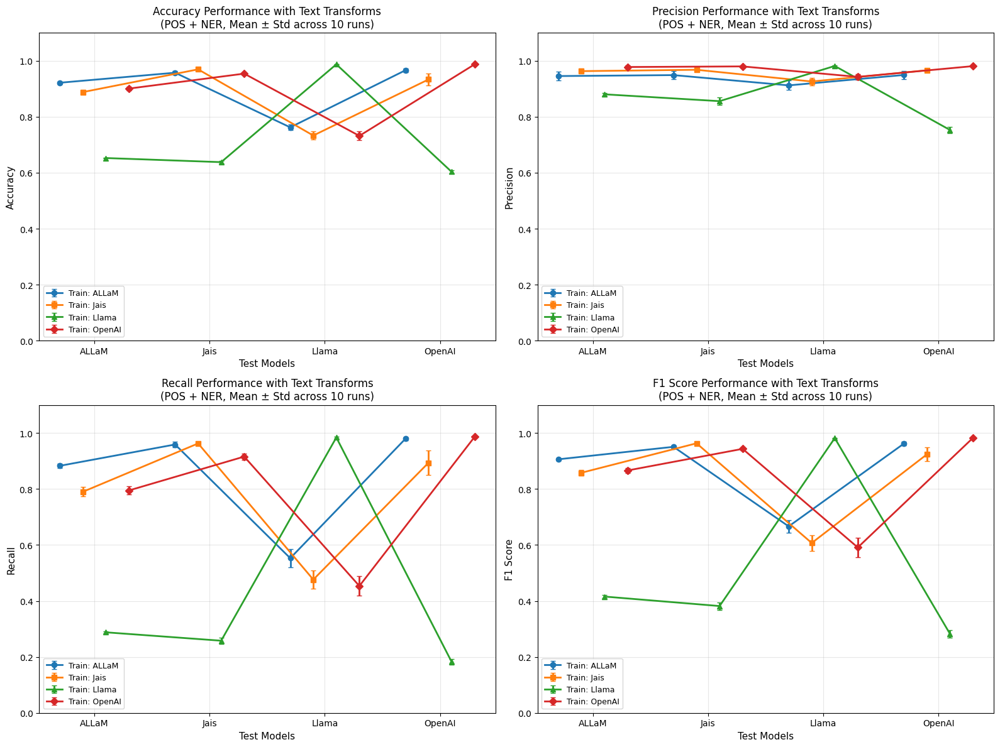


Performance graphs generated for all metrics with text transforms across 10 runs.
Text Transforms used: POS and NER
Each point shows mean performance with error bars indicating ±1 standard deviation.


In [11]:
# Plot performance graphs
def plot_cross_model_performance_with_text_transforms():
    """Plot performance graphs for all metrics with text transforms."""
    stats = experiment.calculate_statistics()
    
    metrics = ['accuracy', 'precision', 'recall', 'f1']
    metric_titles = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()
    
    model_display_names = {
        'allam': 'ALLaM',
        'jais-batched': 'Jais',
        'llama-batched': 'Llama', 
        'openai': 'OpenAI'
    }
    
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
    markers = ['o', 's', '^', 'D']
    
    for metric_idx, metric in enumerate(metrics):
        ax = axes[metric_idx]
        
        for train_idx, train_model in enumerate(experiment.train_models):
            if train_model in stats:
                test_means = []
                test_stds = []
                test_labels = []
                
                for test_model in experiment.test_models:
                    if test_model in stats[train_model]:
                        mean_val = stats[train_model][test_model].get(f'{metric}_mean', 0) / 100
                        std_val = stats[train_model][test_model].get(f'{metric}_std', 0) / 100
                        test_means.append(mean_val)
                        test_stds.append(std_val)
                        test_labels.append(model_display_names[test_model])
                
                if test_means:
                    x_positions = np.arange(len(test_labels)) + train_idx * 0.2
                    ax.errorbar(x_positions, test_means, yerr=test_stds,
                               label=f'Train: {model_display_names[train_model]}', 
                               color=colors[train_idx], marker=markers[train_idx],
                               linewidth=2, markersize=6, capsize=3, capthick=1)
        
        ax.set_xlabel('Test Models', fontsize=11)
        ax.set_ylabel(metric_titles[metric_idx], fontsize=11)
        ax.set_title(f'{metric_titles[metric_idx]} Performance with Text Transforms\n(POS + NER, Mean ± Std across {experiment.num_runs} runs)', fontsize=12)
        ax.set_xticks(np.arange(len(experiment.test_models)) + 0.3)
        ax.set_xticklabels([model_display_names[model] for model in experiment.test_models])
        ax.legend(fontsize=9)
        ax.grid(True, alpha=0.3)
        ax.set_ylim(0, 1.1)
    
    plt.tight_layout()
    plt.show()
    
    print(f"\nPerformance graphs generated for all metrics with text transforms across {experiment.num_runs} runs.")
    print("Text Transforms used: POS and NER")
    print("Each point shows mean performance with error bars indicating ±1 standard deviation.")

# Generate the plots
plot_cross_model_performance_with_text_transforms()

In [12]:
# Show final results file location
print(f"\nFinal results saved to: {experiment.results_file}")
print(f"Results file size: {os.path.getsize(experiment.results_file) / 1024:.2f} KB")


Final results saved to: notebooks/Arabic_experiments/ArabicSocialMediaDataset/multiple_runs/cross_model_detection_with_text_transforms_results.json
Results file size: 43.08 KB
